# DM-32245: It worked!

### This is the AP Pipeline on DECam HiTS 2015 with goodSeeing HiTS2014 templates, all tracts, with fakes

Most everything looks good, but there are some interesting differences since I last managed a full HiTS run nearly a year ago. The injected fake sources are all over each tract instead of just where data exists, and I'm not sure if it's worth doing anything about that.

In [1]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd

from astropy.coordinates import SkyCoord
import astropy.units as u

import lsst.geom
import lsst.daf.butler as dafButler
from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig

sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla
import plotLightcurve as plc
import coaddAnalysis as coa

In [38]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)
importlib.reload(plc)
importlib.reload(coa)

<module 'coaddAnalysis' from '/project/mrawls/ap_pipe-notebooks/coaddAnalysis.py'>

In [2]:
repo = '/repo/main'
butler = dafButler.Butler(repo)

In [3]:
collections = 'u/mrawls/DM-32245-DECam-fakes-all'
instrument = 'DECam'
skymap = 'hsc_rings_v1'
schema = 'mrawls_DM32245'

In [4]:
badFlagList = ['base_PixelFlags_flag_bad',
               'base_PixelFlags_flag_suspect',
               'base_PixelFlags_flag_saturatedCenter',
               'base_PixelFlags_flag_interpolated',
               'base_PixelFlags_flag_interpolatedCenter',
               'base_PixelFlags_flag_edge',
              ]

In [5]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo,
                                                      dbType='postgres',
                                                      dbName='lsstdevapdb1',
                                                      schema=schema,
                                                      gen='gen3',
                                                      instrument=instrument,
                                                      badFlagList=badFlagList)

In [6]:
srcTable = pla.addVisitCcdToSrcTable(srcTable, instrument=instrument, gen='gen3', butler=butler)
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = pla.makeSrcTableFlags(srcTable, objTable,
                                                                               badFlagList=badFlagList,
                                                                               gen='gen3',
                                                                               instrument=instrument,
                                                                               repo=repo)

<IPython.core.display.Javascript object>


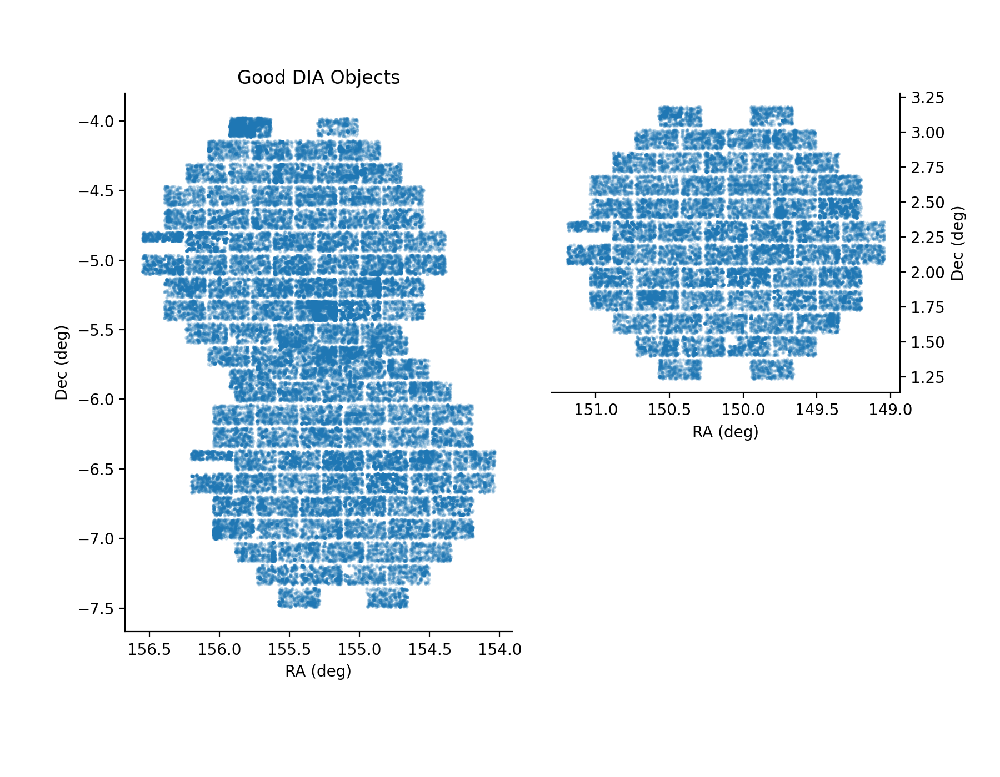

In [7]:
hitsPlot = pla.plotHitsSourcesOnSky(goodObj, title='Good DIA Objects')

<IPython.core.display.Javascript object>


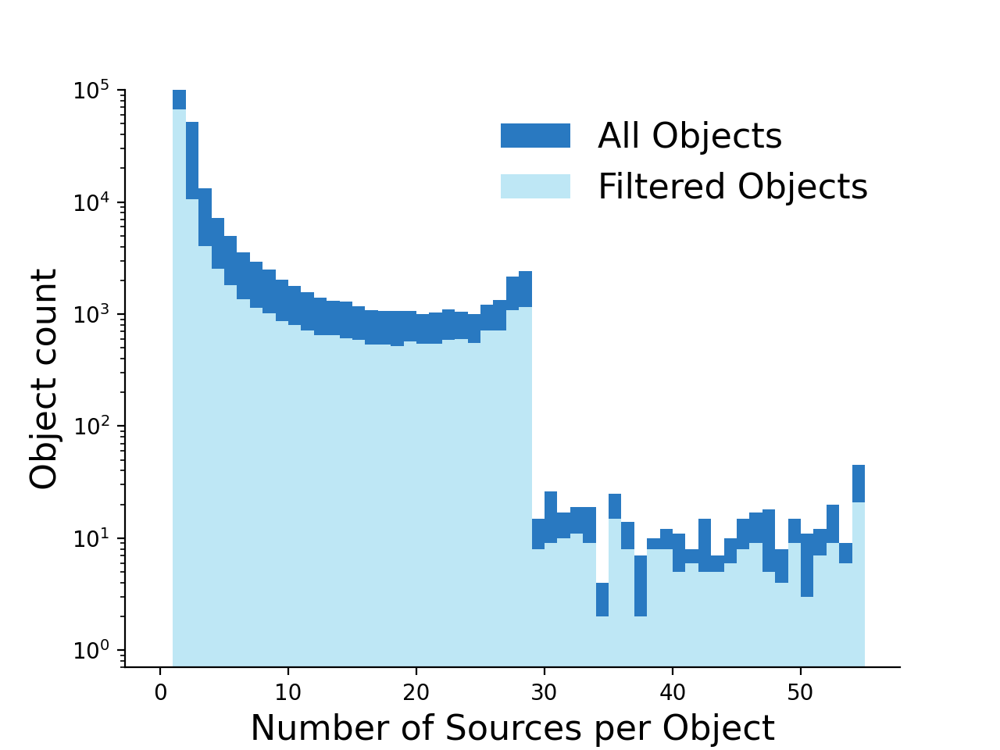

In [9]:
hist = doa.plotDiaObjectHistogram(objTable, goodObj)

<IPython.core.display.Javascript object>


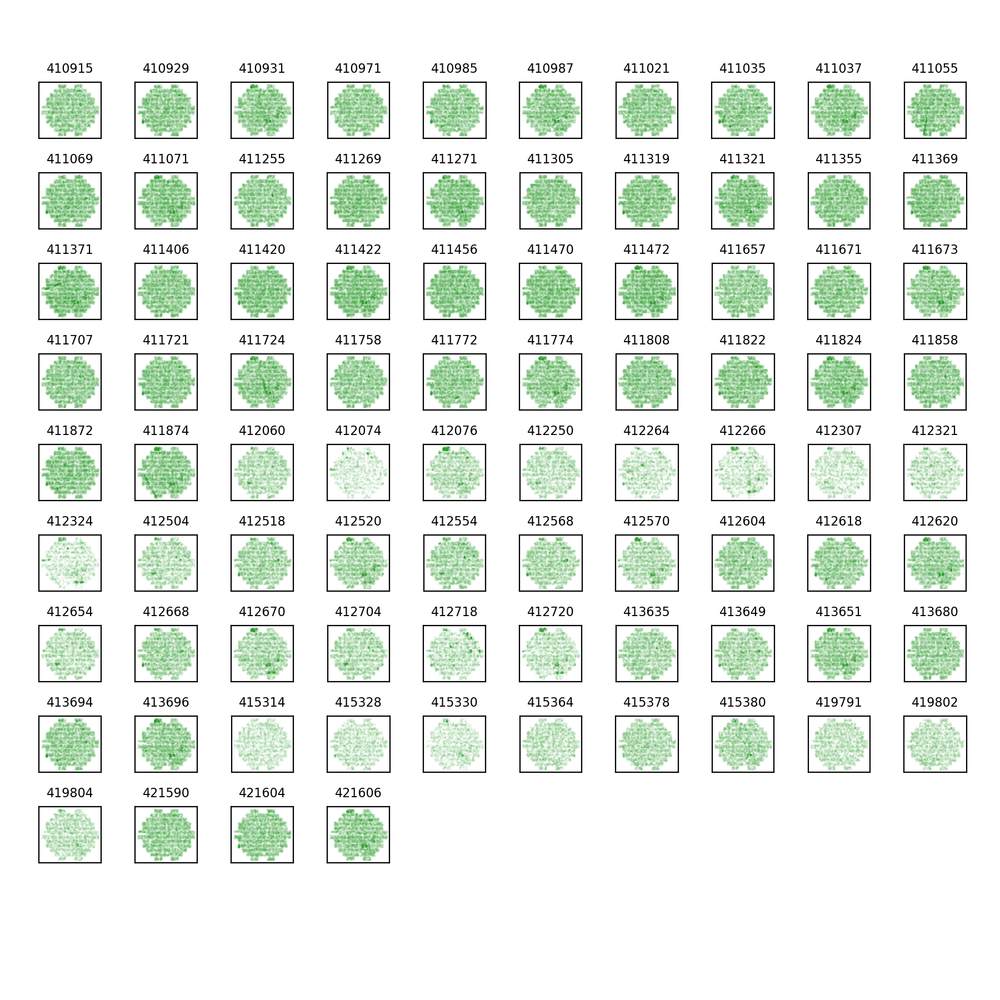

In [9]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc, color='C2')

<IPython.core.display.Javascript object>


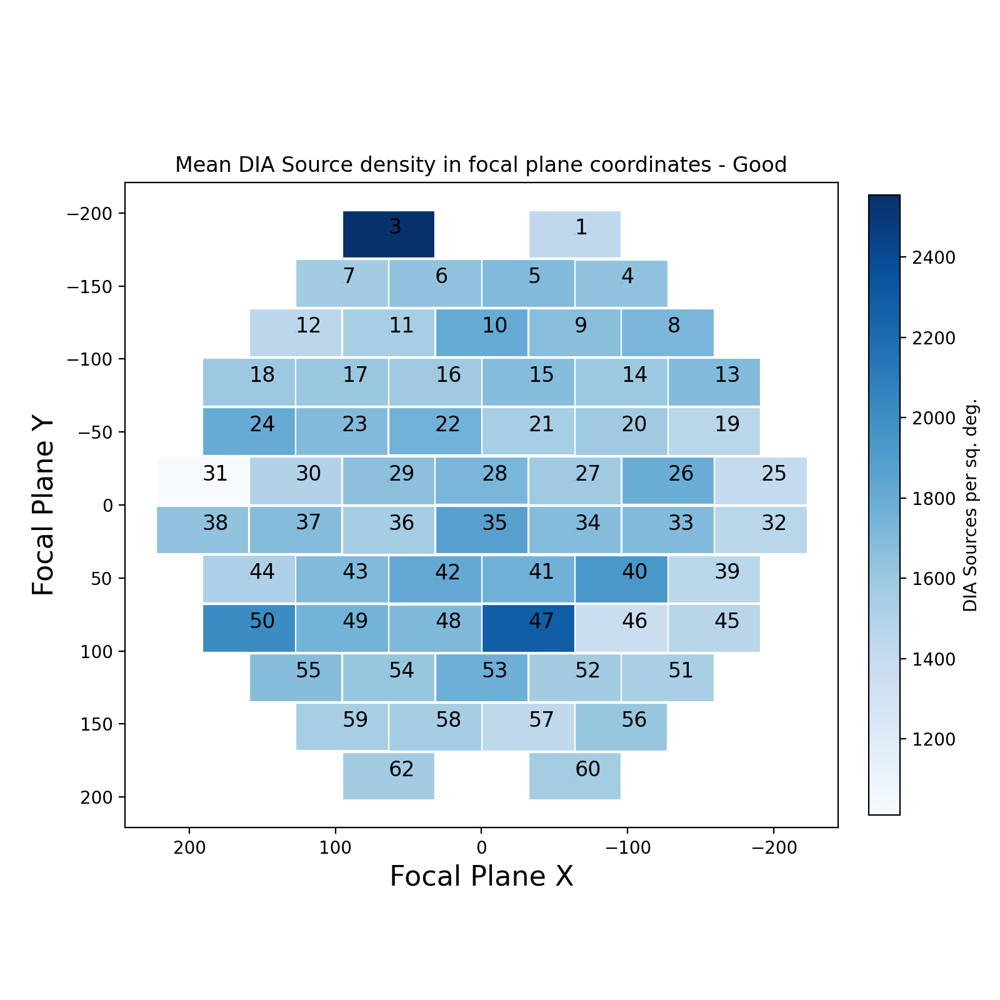

In [39]:
pla.plotDiaSourceDensityInFocalPlane(repo, goodSrc, title='- Good', gen='gen3', instrument='DECam',
                                     collections=collections)

<IPython.core.display.Javascript object>


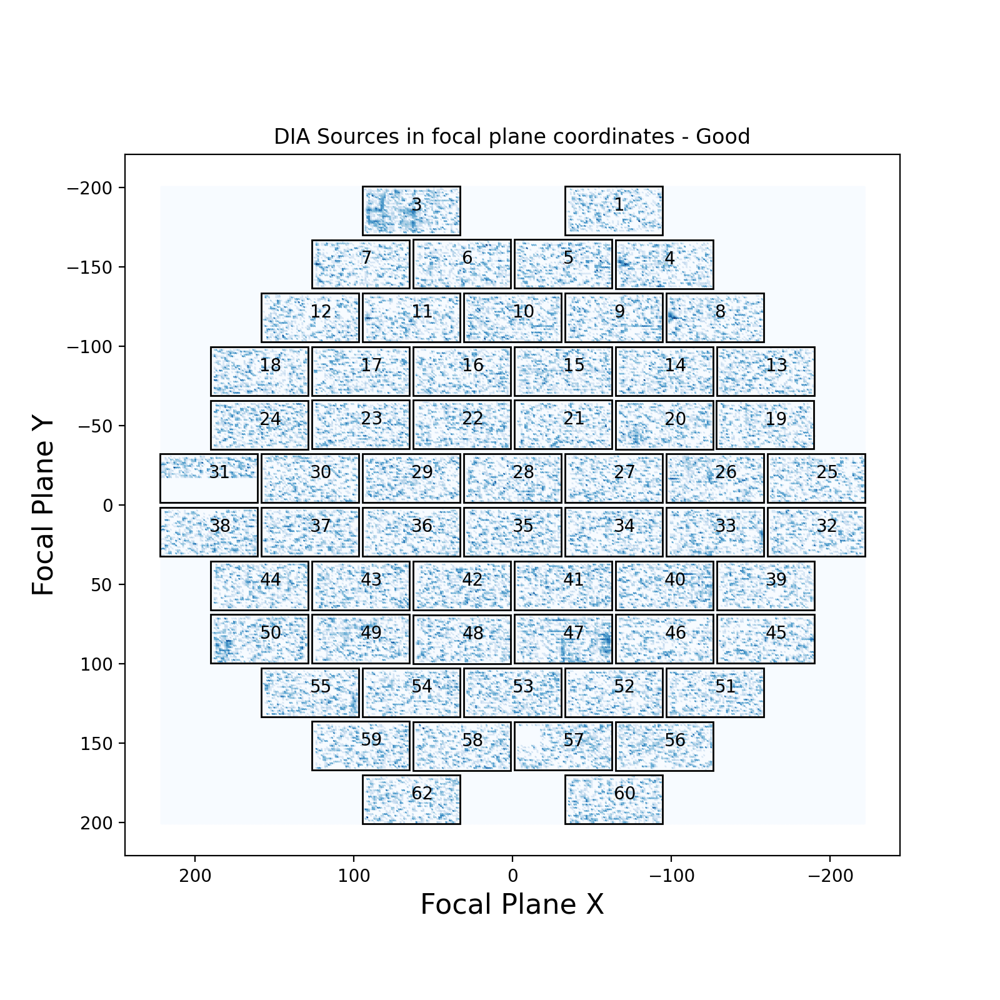

In [15]:
pla.plotDiaSourcesInFocalPlane(repo, goodSrc, title='- Good', gen='gen3', instrument='DECam',
                               collections=collections)

In [14]:
def plotFluxHistSrc(srcTable1, srcTable2=None, fluxType='psFlux', label1=None, label2=None, title=None, ylog=False):
    plt.figure(figsize=(7, 5))
    plt.xlabel(fluxType, size=12)
    plt.ylabel('DIA Source count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-1e4, 1e4, 200)
    if ylog:
        plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1[fluxType].values, bins=bins, color='#2979C1', label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2[fluxType].values, bins=bins, color='#Bee7F5', label=label2)
    if label1:
        plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


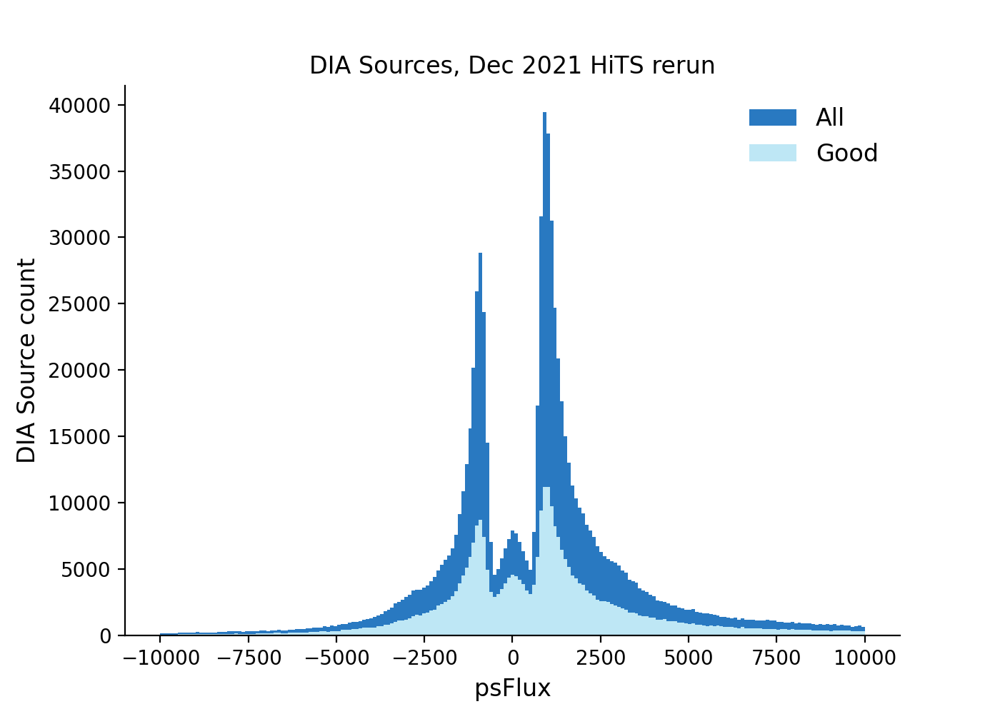

In [15]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title='DIA Sources, Dec 2021 HiTS rerun')

<IPython.core.display.Javascript object>


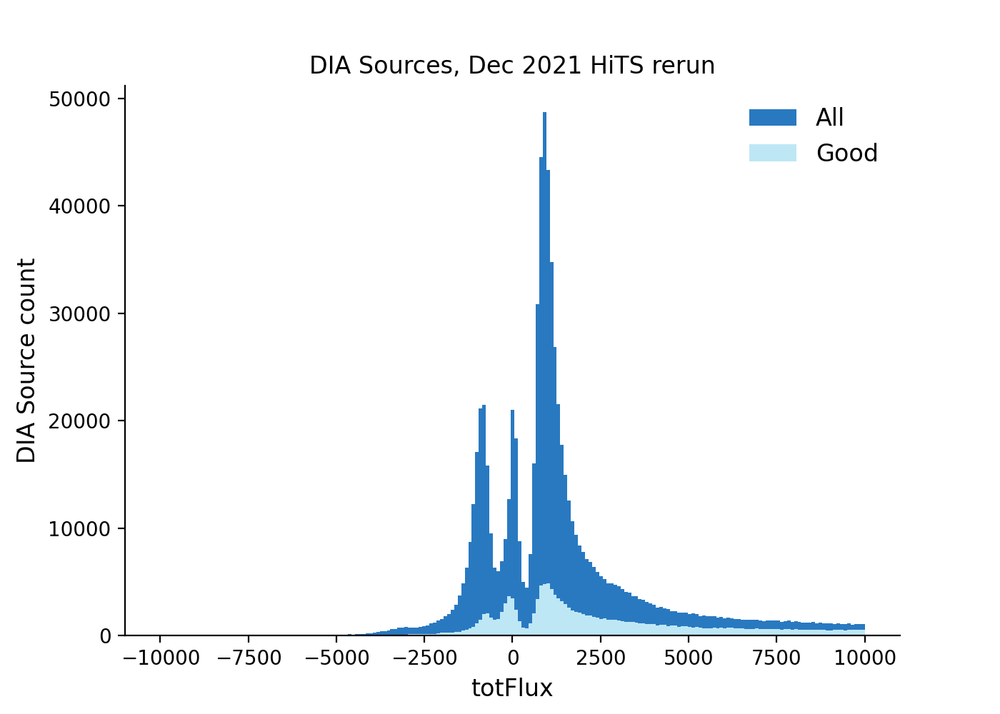

In [16]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title='DIA Sources, Dec 2021 HiTS rerun')

In [44]:
# Load Jan 2021(!!) rerun
repo_old = '/project/mrawls/hits2015-3'
objTable_old, srcTable_old, goodObj_old, goodSrc_old = pla.loadTables(repo_old, dbName='association-DM-27370-2.db')

<IPython.core.display.Javascript object>


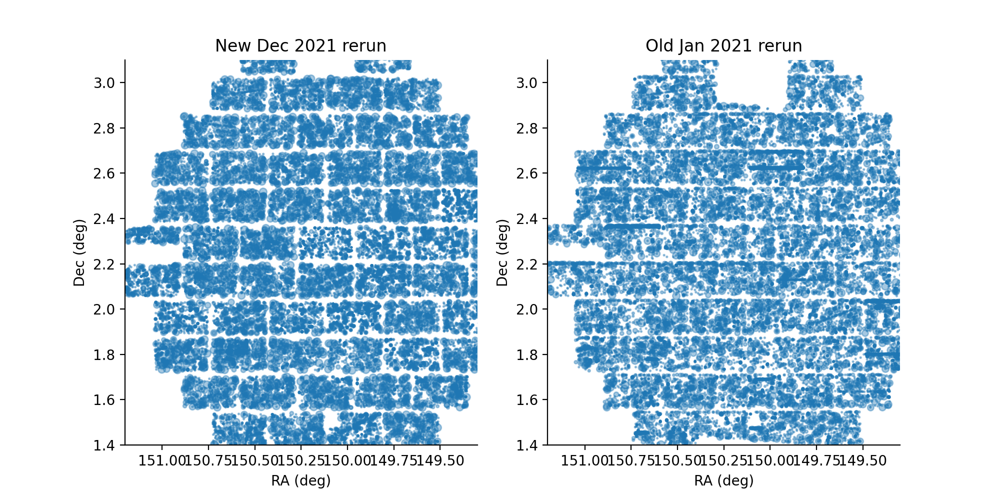

Text(0.5, 1.0, 'Old Jan 2021 rerun')

In [18]:
fig = plt.figure(figsize=(10,5))

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj['ra'], goodObj['decl'], c='C0', s=goodObj['nDiaSources'], marker='o', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title('New Dec 2021 rerun')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old['ra'], goodObj_old['decl'], c='C0', s=goodObj_old['nDiaSources'], marker='o', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title('Old Jan 2021 rerun')

<IPython.core.display.Javascript object>


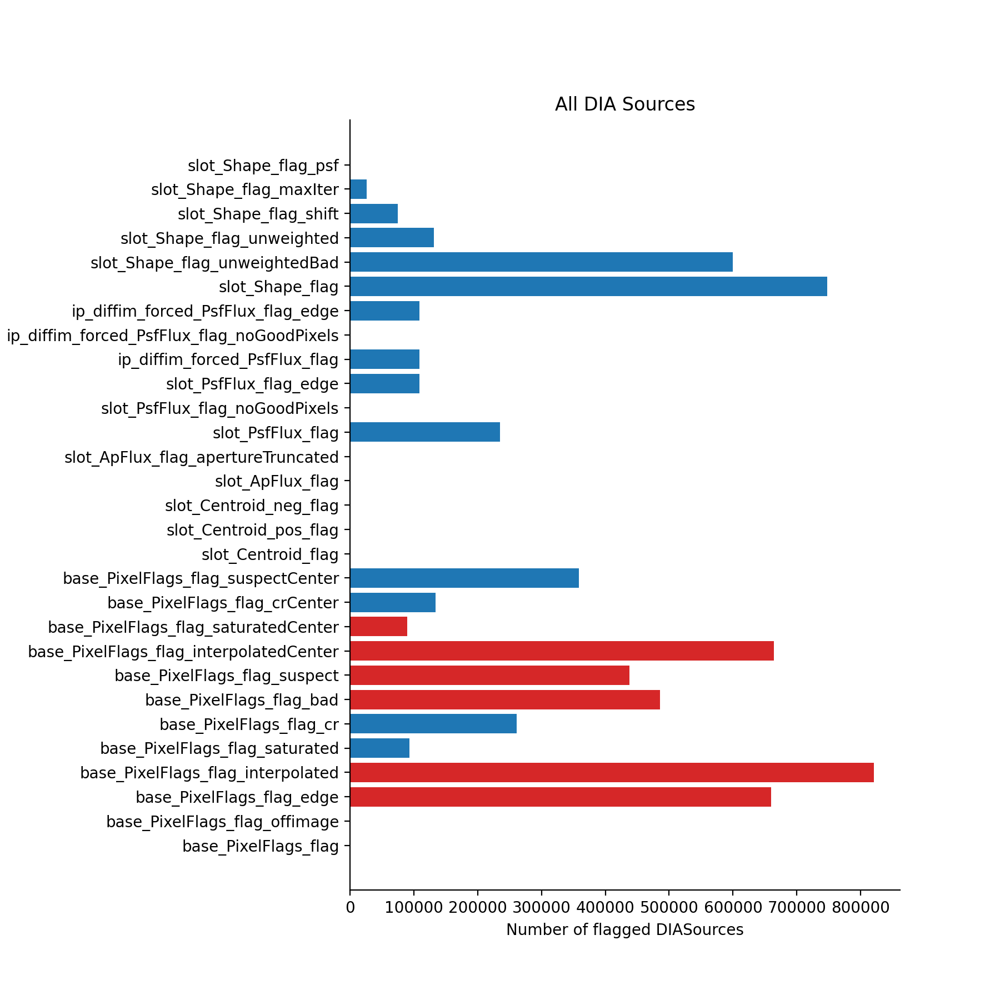

In [14]:
pla.plotFlagHist(srcTable, title='All DIA Sources', badFlagList=badFlagList)

In [40]:
# Actually add the flag info into a the srcTable for plotting purposes
flagTable, srcTableFlags, flagFilter, _, _ = pla.makeSrcTableFlags(srcTable, objTable)

In [41]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True, title=''):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    xlim = (150.8, 149.8)
    ylim = (2.4, 3.1)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    
    #ax.invert_xaxis()
    #box = ax.get_position()
    #ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    #ax.legend(bbox_to_anchor=(0.9, 0.9))
    
    plt.title(title)

<IPython.core.display.Javascript object>


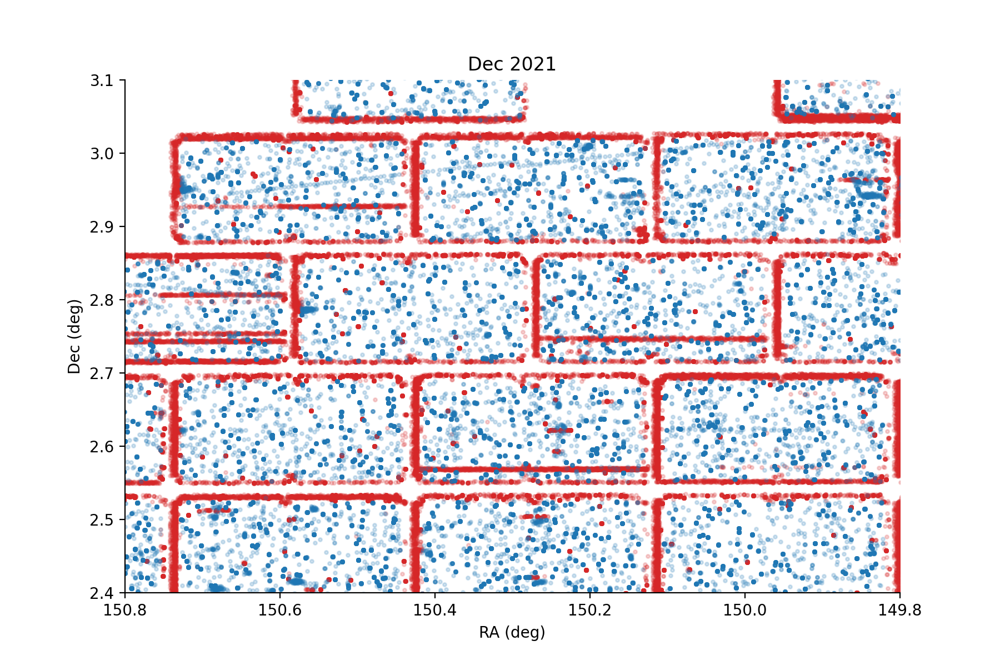

Flagged sources: 697719
Unflagged sources: 532901


In [42]:
spatial_flag_plot(srcTableFlags, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='Dec 2021')

In [45]:
# Compare what the flags looked like in the Jan 2021 rerun
flagTable_old, srcTableFlags_old, flagFilter_old, _, _ = pla.makeSrcTableFlags(srcTable_old, objTable_old)

<IPython.core.display.Javascript object>


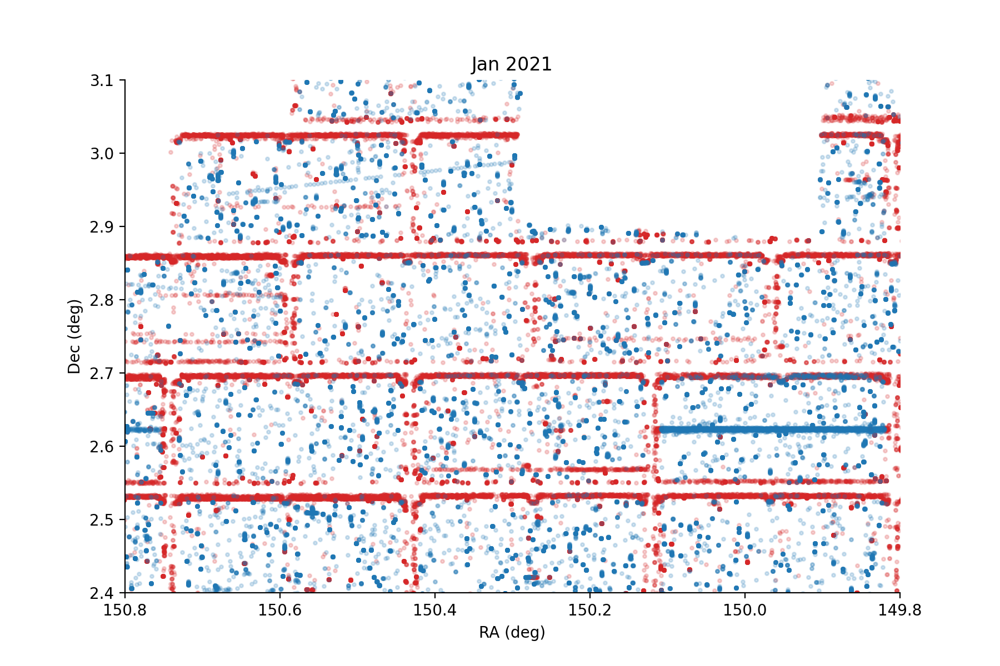

Flagged sources: 436282
Unflagged sources: 291895


In [46]:
spatial_flag_plot(srcTableFlags_old, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='Jan 2021')

## Fakes analysis

Most of this is copied from the DM-31340 notebook.

In [47]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')

In [48]:
%%time
visitDetectorFrames = []

i = 0
#maxi = 1000
maxi = -1

for datasetRef in fakesMatchDiaSrc: 
    try:
        frame = butler.getDirect(datasetRef)
        
        # nondetected sources don't have DIASource records--so propagate metadata to all rows
        # grab a detected row
        w = frame['diaSourceId'] > 0
        if np.sum(w) == 0:
            print(f'No real sources detected in {datasetRef}')
            continue
        ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
        filterName = frame.loc[w,'filterName'].iloc[0]
        # propagate to all rows
        frame.loc[:,'ccdVisitId'] = ccdVisitId 
        frame.loc[:,'filterName'] = filterName 
    #except LookupError:
        #print(f'No data for {datasetRef}')
        #continue
    except Exception as e:
        raise(e)
    else:
        visitDetectorFrames.append(frame)
    i+=1
    if i == maxi:
        break

matchedDiaSources = pd.concat(visitDetectorFrames)

matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['raJ2000'])
matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['decJ2000'])

CPU times: user 2min 9s, sys: 29.9 s, total: 2min 39s
Wall time: 10min 44s


In [124]:
matchedDiaSources

,fakeId,decJ2000,raJ2000,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,...,dipChi2,isDipole,totFlux,totFluxErr,ixx,iyy,ixy,ixxPSF,iyyPSF,ixyPSF
0,13534681127408247805,-0.072401,2.709907,True,False,21.696357,21.696357,21.696357,21.696357,21.696357,...,NaN,False,5620.339158,790.828322,1.093327,1.362057,-0.094694,1.293988,-0.047716,-0.047716
1,12517213497335822471,-0.074189,2.708237,True,False,22.866676,22.866676,22.866676,22.866676,22.866676,...,NaN,False,4172.000510,735.037354,0.484980,0.517812,0.163431,1.296650,-0.047814,-0.047814
2,9564501637131015258,-0.073525,2.709007,True,False,23.659732,23.659732,23.659732,23.659732,23.659732,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9663710125584175164,-0.072277,2.712204,True,False,22.920746,22.920746,22.920746,22.920746,22.920746,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10984479670300352445,-0.072229,2.709698,True,False,21.718303,21.718303,21.718303,21.718303,21.718303,...,NaN,False,6837.446067,785.544746,1.521887,1.626949,0.017342,1.292310,-0.047654,-0.047654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,9766207530105008943,-0.088418,2.695096,False,True,22.546725,22.546725,22.546725,22.546725,22.546725,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91,10338095690771369886,-0.088955,2.698856,False,True,22.330022,22.330022,22.330022,22.330022,22.330022,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92,10763485052700251634,-0.087085,2.698267,False,True,20.414012,20.414012,20.414012,20.414012,20.414012,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93,9788339819594664355,-0.087671,2.697589,False,True,25.837392,25.837392,25.837392,25.837392,25.837392,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
matchedDiaSources.columns

Index(['fakeId', 'decJ2000', 'raJ2000', 'isVisitSource', 'isTemplateSource',
       'u_mag', 'g_mag', 'r_mag', 'i_mag', 'z_mag', 'y_mag',
       'DiskHalfLightRadius', 'BulgeHalfLightRadius', 'disk_n', 'bulge_n',
       'a_d', 'a_b', 'b_d', 'b_b', 'pa_disk', 'pa_bulge', 'sourceType',
       'diaSourceId', 'ccdVisitId', 'filterName', 'diaObjectId', 'ssObjectId',
       'parentDiaSourceId', 'midPointTai', 'bboxSize', 'flags', 'ra', 'decl',
       'x', 'y', 'xErr', 'yErr', 'apFlux', 'apFluxErr', 'snr', 'psFlux',
       'psFluxErr', 'psChi2', 'psNdata', 'trailRa', 'trailDecl', 'trailLength',
       'trailAngle', 'dipMeanFlux', 'dipMeanFluxErr', 'dipFluxDiff',
       'dipFluxDiffErr', 'dipLength', 'dipAngle', 'dipChi2', 'isDipole',
       'totFlux', 'totFluxErr', 'ixx', 'iyy', 'ixy', 'ixxPSF', 'iyyPSF',
       'ixyPSF'],
      dtype='object')

In [143]:
def plotMatchedFakesHits(matchedDiaSources, title=None, useMatched=True):
    plt.figure(figsize=(9, 7))
    ax1 = plt.subplot2grid((100, 100), (0, 55),
                           rowspan=50, colspan=45)  # 1 single HiTS field, on the right
    ax2 = plt.subplot2grid((100, 100), (0, 0),
                           rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left
    ax1Filter = (matchedDiaSources['decl'] > -2)
    ax2Filter = (~ax1Filter)
    
    if useMatched:
        ax1Filter = ax1Filter & (matchedDiaSources['diaSourceId'] > 0)
        ax2Filter = ax2Filter & (matchedDiaSources['diaSourceId'] > 0)

    ax1.scatter(matchedDiaSources.loc[ax1Filter, 'ra'],
                matchedDiaSources.loc[ax1Filter, 'decl'],
                c='C0', s=0.5, alpha=0.2)
    ax2.scatter(matchedDiaSources.loc[ax2Filter, 'ra'],
                matchedDiaSources.loc[ax2Filter, 'decl'],
                c='C0', s=0.5, alpha=0.2)
    ax1.set_xlabel('RA (deg)')
    ax2.set_xlabel('RA (deg)')
    ax1.set_ylabel('Dec (deg)')
    ax2.set_ylabel('Dec (deg)')
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax1.invert_xaxis()
    ax2.invert_xaxis()
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    plt.title(title)
    plt.subplots_adjust(wspace=0.1, hspace=0)

<IPython.core.display.Javascript object>


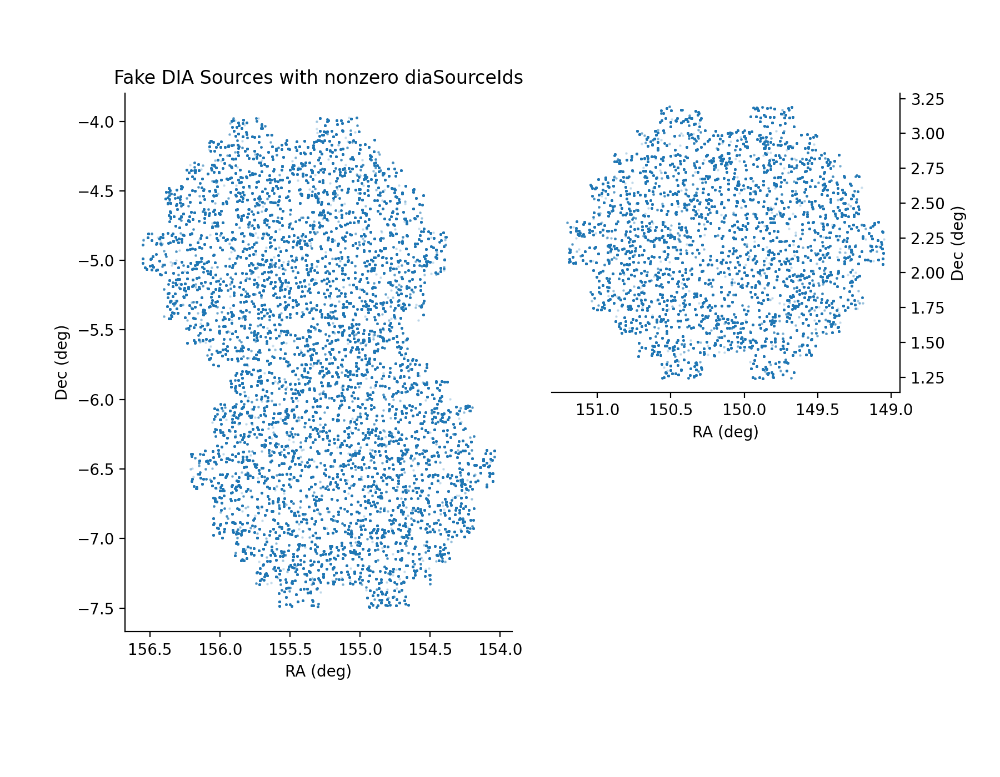

In [144]:
#plt.figure()
#plt.scatter(matchedDiaSources.ra, matchedDiaSources.decl, marker='.', s=0.1)
plotMatchedFakesHits(matchedDiaSources, title='Fake DIA Sources with nonzero diaSourceIds')

<IPython.core.display.Javascript object>


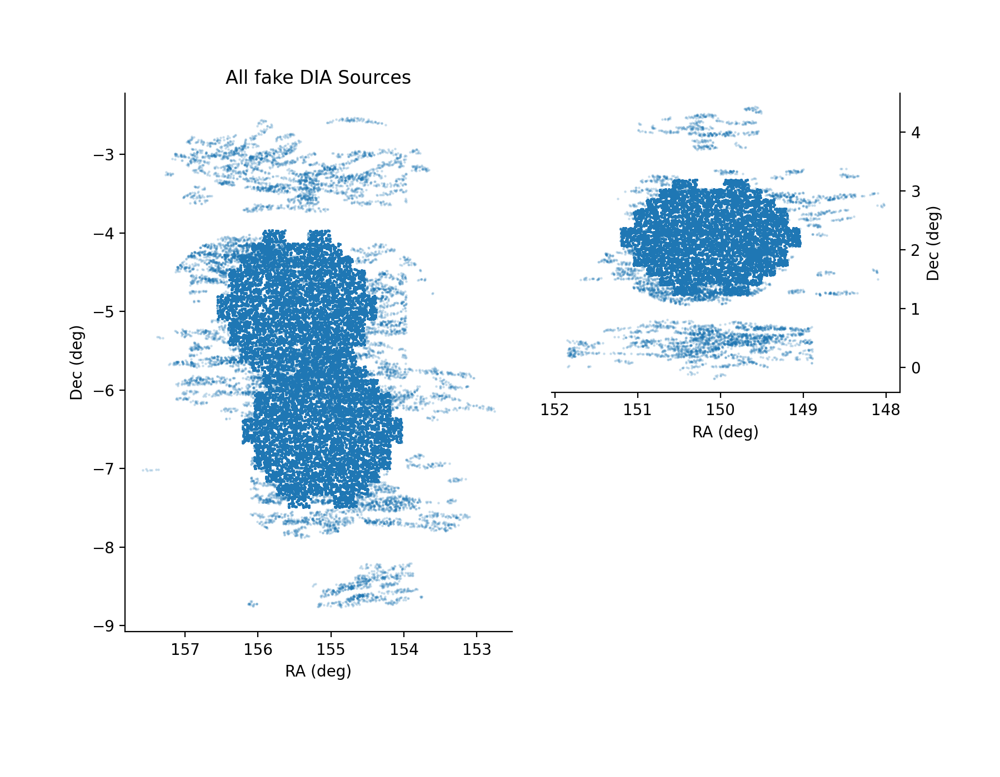

In [145]:
plotMatchedFakesHits(matchedDiaSources, title='All fake DIA Sources', useMatched=False)

In [100]:
wScienceOnly = matchedDiaSources['isVisitSource'] & ~matchedDiaSources['isTemplateSource']
wMatched = matchedDiaSources['diaSourceId'] > 0

# we need a sensible spatial cut here
minra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].min()
maxra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].max()
mindecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].min()
maxdecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].max()

# apply the min/max ra/dec, and also exclude all points between dec -4 and 1 and between ra 151.5 and 154
wRADec = (matchedDiaSources.ra < maxra ) & (matchedDiaSources.ra > minra ) & \
         (matchedDiaSources.decl > mindecl ) & (matchedDiaSources.decl < maxdecl ) & \
         ((matchedDiaSources.decl < -4) | (matchedDiaSources.decl > 1)) &\
         ((matchedDiaSources.ra > 154) | (matchedDiaSources.ra < 151.5))

<IPython.core.display.Javascript object>


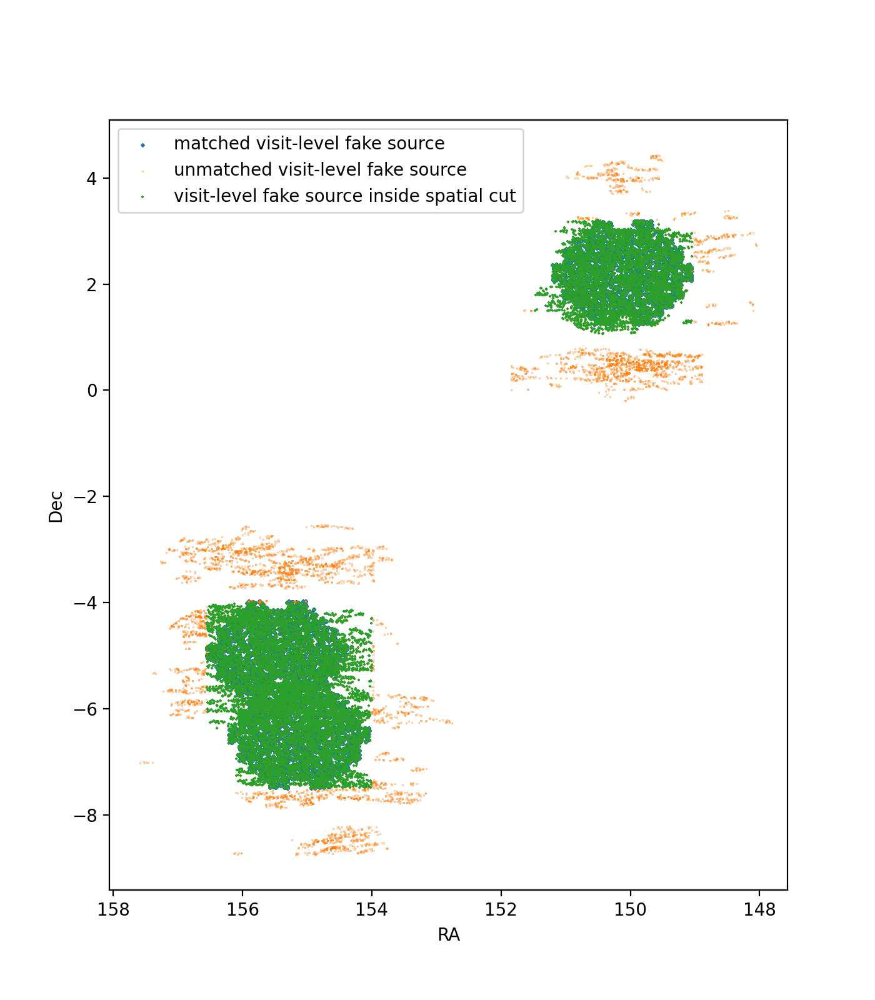

In [101]:
plt.figure(figsize=(7,8))
plt.scatter(matchedDiaSources.loc[wScienceOnly & wMatched,'ra'],
            matchedDiaSources.loc[wScienceOnly & wMatched,'decl'],
            marker='x', c='C0', s=2, label='matched visit-level fake source')
plt.scatter(matchedDiaSources.loc[wScienceOnly & ~wMatched,'ra'],
            matchedDiaSources.loc[wScienceOnly & ~wMatched,'decl'],
            marker='.', c='C1', s=0.1, label='unmatched visit-level fake source')
plt.scatter(matchedDiaSources.loc[wScienceOnly & wRADec,'ra'],
            matchedDiaSources.loc[wScienceOnly & wRADec,'decl'],
            marker='+', c='C2', s=1, label='visit-level fake source inside spatial cut')
plt.gca().invert_xaxis()
plt.xlabel('RA')
plt.ylabel('Dec')
plt.legend()

In [102]:
bins = np.linspace(20, 26, 70)
n_matched, edges = np.histogram(matchedDiaSources.loc[wMatched& wScienceOnly & wRADec,'g_mag'], bins=bins)
nmatched_err = np.sqrt(n_matched)

n_unmatched, edges = np.histogram(matchedDiaSources.loc[~wMatched & wScienceOnly & wRADec, 'g_mag'], bins=bins)
ntot = n_matched + n_unmatched
#print(n_matched, n_unmatched, ntot)
completeness_all = n_matched/ntot

# Attempt to compute some kind of error
ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
#print(ntot_err)
completeness_err_all = completeness_all * np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)

<IPython.core.display.Javascript object>


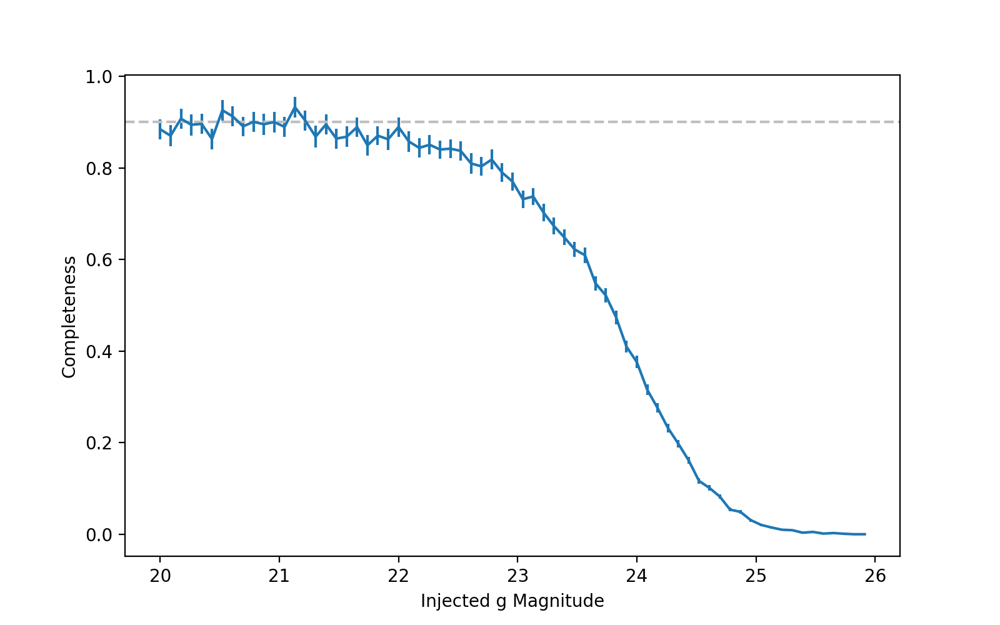

Text(0, 0.5, 'Completeness')

In [103]:
figure = plt.figure(figsize=(8,5))
plt.errorbar(bins[0:-1], completeness_all, completeness_err_all)
#plt.plot(bins[0:-1], completeness, marker='o', ms=5, ls=':')

plt.axhline(.9, ls='--', color='0.75', label='90%')
plt.xlabel('Injected g Magnitude')
plt.ylabel('Completeness')
#plt.ylim(0.7, 1.)

In [119]:
bins = np.linspace(20, 26, 70)
bandList = ['g']

completeness_byband = {}
completeness_err_byband = {}

for band in bandList:
    wband = matchedDiaSources['filterName'] == band

    n_matched, edges = np.histogram(matchedDiaSources.loc[wMatched& wScienceOnly & wRADec & wband,f'{band}_mag'], bins=bins)
    nmatched_err = np.sqrt(n_matched)

    n_unmatched, edges = np.histogram(matchedDiaSources.loc[~wMatched & wScienceOnly & wRADec  & wband, f'{band}_mag'], bins=bins)
    ntot = n_matched + n_unmatched
    #print(n_matched, n_unmatched, ntot)
    completeness_byband[band] = n_matched/ntot

    # Attempt to compute some kind of error
    ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
    #print(ntot_err)
    completeness_err_byband[band] = completeness_byband[band] * np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)

In [104]:
# make a rough and ready estimate of the flux error
def estimate_fluxlim(flux, fluxerr, snr=5, snr_window_halfwidth=0.1):
    snr_all = np.abs(flux/fluxerr)
    wwindow = ((snr-snr_window_halfwidth) <= snr_all) & (snr_all <=  (snr+snr_window_halfwidth))
    if np.sum(wwindow) < 3:
        return np.nan
    return np.median(np.abs(flux.loc[wwindow]))
    
    
def estimate_maglim(flux, fluxerr, snr=5):
    fluxlim = estimate_fluxlim(flux, fluxerr, snr=snr)
    return (fluxlim * u.nJy).to(u.ABmag).value

In [105]:
estimate_fluxlim(goodSrc['psFlux'],goodSrc['psFluxErr'])

1068.9473042364207

In [106]:
estimate_maglim(goodSrc['psFlux'],goodSrc['psFluxErr'])

23.82760925906277

In [107]:
maglims5 = {}
maglims6 = {}

for ccdVisitId, grp in goodSrc.groupby('ccdVisitId'):
    maglims5[ccdVisitId] = estimate_maglim(grp['psFlux'],grp['psFluxErr'],snr=5)
    maglims6[ccdVisitId] = estimate_maglim(grp['psFlux'],grp['psFluxErr'],snr=6)

In [108]:
lim5 = pd.Series(maglims5)
lim5.name = 'maglim5'
lim6 = pd.Series(maglims6)
lim6.name = 'maglim6'

dflim = pd.concat([lim5,lim6],axis=1)

In [109]:
filter_by_ccd = goodSrc.loc[goodSrc['diaSourceId'] > 0,['ccdVisitId','filterName']].groupby('ccdVisitId').agg(lambda x: np.unique(x)[0])
filter_by_ccd.name = 'filterName'
dflim = dflim.join(filter_by_ccd)

In [110]:
dflim = dflim.reset_index()
dflim.rename(columns={'index':'ccdVisitId'},inplace=True)
dflim

,ccdVisitId,maglim5,maglim6,filterName
0,41091501,NaN,NaN,g
1,41091503,NaN,23.660744,g
2,41091504,NaN,NaN,g
3,41091505,23.721747,23.741011,g
4,41091506,NaN,23.652248,g
...,...,...,...,...
5035,42160657,23.457800,NaN,g
5036,42160658,24.125341,NaN,g
5037,42160659,23.751951,23.875171,g
5038,42160660,NaN,23.733047,g


<IPython.core.display.Javascript object>


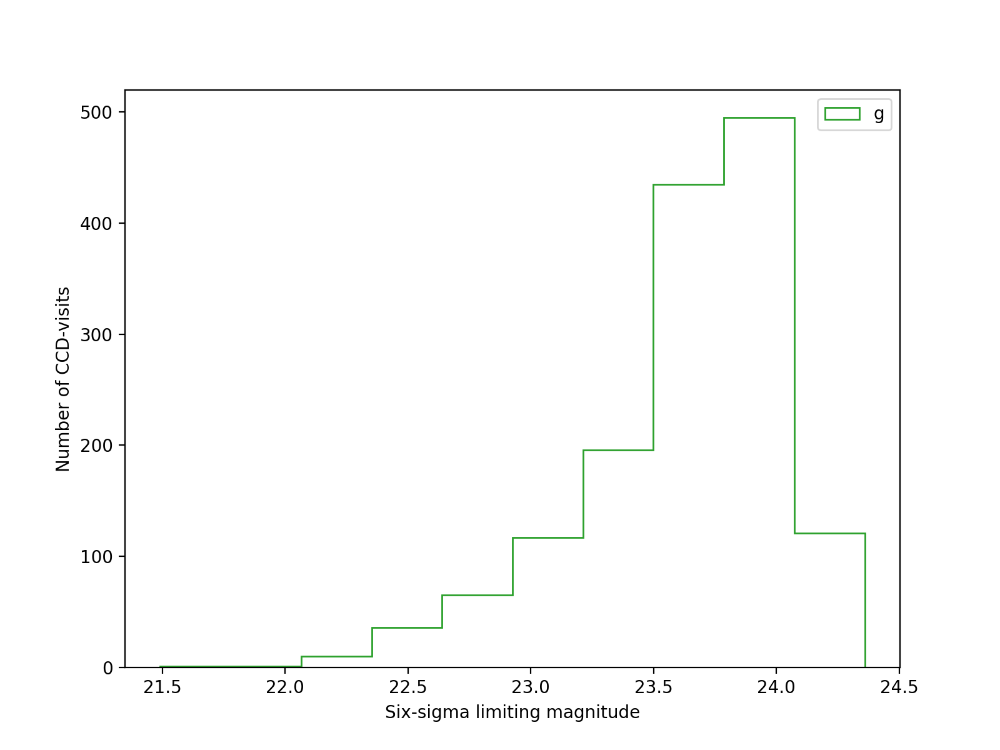

Text(0, 0.5, 'Number of CCD-visits')

In [113]:
plt.figure(figsize=(8,6))

bandList = ['g']
colorList = ['C2']

for band, color in zip(bandList, colorList):
    plt.hist(dflim.loc[dflim['filterName'] == band,'maglim6'],color=color,histtype='step',label=band)
    plt.legend()
plt.xlabel('Six-sigma limiting magnitude')
plt.ylabel('Number of CCD-visits')

<IPython.core.display.Javascript object>


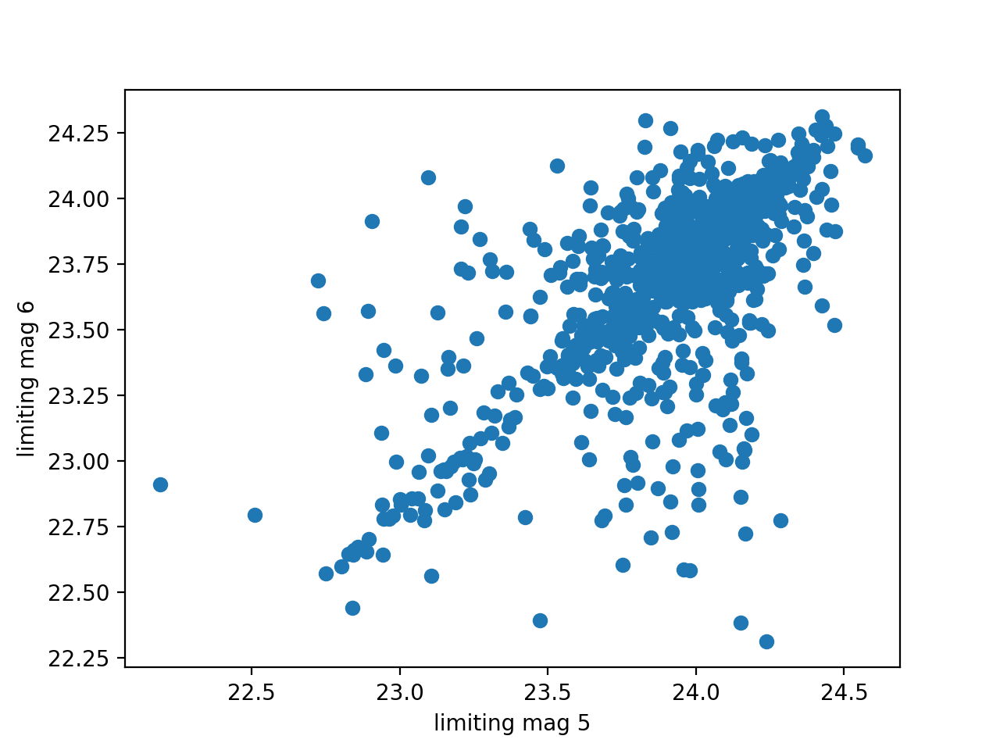

Text(0, 0.5, 'limiting mag 6')

In [115]:
plt.figure()
plt.scatter(pd.Series(maglims5).values, pd.Series(maglims6).values)
plt.xlabel('limiting mag 5')
plt.ylabel('limiting mag 6')

In [121]:
p25_limmag = dflim.groupby('filterName').agg(lambda x: np.nanpercentile(x,25))
p75_limmag = dflim.groupby('filterName').agg(lambda x: np.nanpercentile(x,75))
median_limmag = dflim.groupby('filterName').agg(lambda x: np.nanpercentile(x,50))

<IPython.core.display.Javascript object>


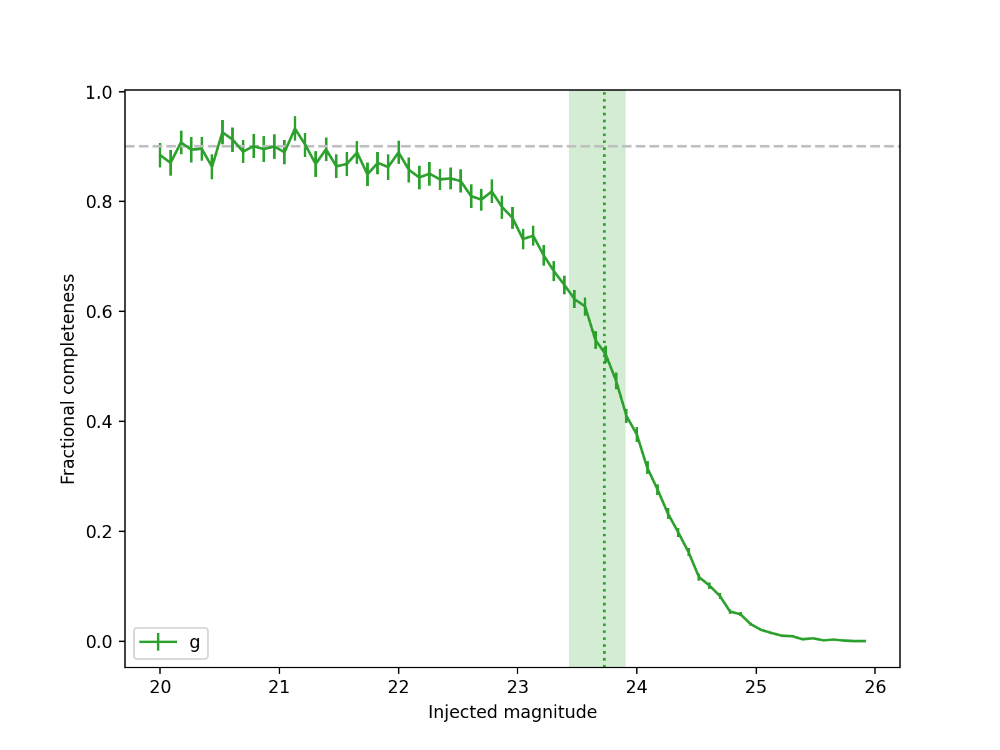

Text(0, 0.5, 'Fractional completeness')

In [123]:
plt.figure(figsize=(8, 6))

for band, color in zip(bandList, colorList):
    plt.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color,label=band)
    plt.axvline(median_limmag.loc[band,'maglim6'], color=color, ls=':')
    plt.axvspan(p25_limmag.loc[band,'maglim6'], p75_limmag.loc[band,'maglim6'],
                facecolor=color, alpha=0.2, edgecolor='none')

plt.axhline(.9, ls='--', color='0.75')#, label='90%')
plt.legend(loc='lower left')
plt.xlabel('Injected magnitude')
plt.ylabel('Fractional completeness')